In [ ]:
reset

In [1]:
import os
import sys
import collections
from collections import Counter
import intake
import warnings
warnings.filterwarnings('ignore')

import xarray as xr
xr.set_options(keep_attrs=True)
import pandas as pd
import numpy as np
import cftime
from scipy.stats import ttest_ind, ttest_rel
from scipy.interpolate import RegularGridInterpolator

import cartopy
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from shapely.geometry.polygon import LinearRing
from shapely.geometry import LineString

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
from matplotlib import cm
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import matplotlib.patheffects as pe

%config InlineBackend.figure_format = 'retina'
dpath0='/Users/dervlamk/OneDrive/research'
dpath1=f'{dpath0}/cmip'
dpath2=f'{dpath0}/topo_nam'
dpath3=f'{dpath0}/obs_data'

In [2]:
# add path to custom functions
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path+"/py_functions")
# import custom functions
#from data_funcs_new import *
from colorbar_funcs import *

In [3]:
def match_lat_lon_names(ds):
    for lat_name in ['y', 'latitude', 'nav_lat']:
        if (lat_name in ds.coords) and ('lat' not in ds.coords):
            ds=ds.rename({lat_name: 'lat'})
        else:
            ds=ds
    for lon_name in ['x', 'longitude', 'nav_lon']:
        if (lon_name in ds.coords) and ('lon' not in ds.coords):
            ds = ds.rename({lon_name: 'lon'})
        else:
            ds=ds
    return ds


def drop_all_bounds(ds):
    drop_vars = [vname for vname in ds.coords
                 if ( (('_bounds') in vname) or 
                     (('_bnds') in vname) )]
    return ds.drop(drop_vars)


def jas_seasonal_mean(ds):
    """
    Calculate seasonal mean accounting for varying month lengths
    ** assumes no leap **
    """    
    jas = ds.sel(time=ds['time.month'].isin([7, 8, 9]))
    weights = jas['time'].dt.days_in_month
    jas_weighted_mean = (jas * weights).sum(dim='time') / weights.sum(dim='time')
    return jas_weighted_mean

def jas_yearly_mean(ds):
    """
    Calculate jas seasonal mean for each year, accounting for varying month lengths
    ** assumes no leap **
    """ 
    jas = ds.sel(time=ds['time.month'].isin([7, 8, 9]))
    weights = jas['time'].dt.days_in_month
    jas_yearly_weighted_mean = ((jas * weights).groupby('time.year').sum(dim='time') / weights.groupby('time.year').sum(dim='time'))
    return jas_yearly_weighted_mean

# CODE TO SHIFT CCSM DATA BY 1 MONTH (given weird NCAR conventions that calendar date is end of time bound for each month)
def shift_dates_1M(dat):
    y_first = str(dat.time.values[0].year).zfill(4)
    y_last = str(dat.time.values[-2].year).zfill(4)

    time2 = xr.cftime_range(start=str(y_first)+'-01-01', end=str(y_last)+'-12-01', freq="1MS", calendar="noleap")
    dat = dat.assign_coords(time=time2)
    return dat

# STATISTICAL SIGNIFICANCE TEST
#test with identical sample sizes
def sigtest(yearmean1,yearmean2,timemean1,timemean2):
    ptvals = ttest_rel(yearmean1,yearmean2, axis=0)
    diff = timemean1-timemean2
    diff_mask = np.ma.masked_where(ptvals[1] > 0.1,diff)
    return diff, diff_mask, ptvals

# test with different sample sizes
def sigtest2n(yearmean1,yearmean2,timemean1,timemean2):
    ptvals = ttest_ind(yearmean1,yearmean2, axis=0, equal_var = False)
    diff = timemean1-timemean2
    diff_mask = np.ma.masked_where(ptvals[1] > 0.1,diff)
    return diff, diff_mask, ptvals

In [4]:
# functions to convert model calendar types

CF_CALENDAR_MAP = {
    'noleap': cftime.DatetimeNoLeap,
    '360_day': cftime.Datetime360Day,
    'gregorian': cftime.DatetimeGregorian,
    'proleptic_gregorian': cftime.DatetimeProlepticGregorian
}

def get_calendar(da):
    """
    Detect the calendar type for a given Data Array
    """
    if hasattr(da, "time"):
        time = da.time.values
        
        if len(time) > 0 and hasattr(time[0], "calendar"):
            return time[0].calendar
        
        elif isinstance(time[0], np.datetime64):
            return "proleptic_gregorian"
        
    return None

def convert_time_calendar(da, target_calendar='NoLeap', force=False):
    """
    Convert the time coordinate of a DataArray to a specified CF calendar.

    Parameters
    ----------
    da : xarray.DataArray
        Input DataArray with a 'time' coordinate.
    target_calendar : str, optional
        Target CF calendar name (e.g., 'NoLeap', '360Day', 'Gregorian', 'ProlepticGregorian').
    force : bool, optional
        If True, force conversion even if some dates are invalid for the target calendar.
    
    Returns
    -------
    xarray.DataArray
        A copy of the DataArray with 'time' coordinates converted to the target calendar.
    """
    if not hasattr(da, "time"):
        raise ValueError("DataArray has no 'time' coordinate.")

    times = da.time.values
    # In convert_time_calendar:
    if target_calendar not in CF_CALENDAR_MAP:
        raise ValueError(f"Unsupported calendar: {target_calendar}")
    cftime_cls = CF_CALENDAR_MAP[target_calendar]

    new_times = []
    invalid_dates = []

    for t in times:
        # Convert numpy.datetime64 → datetime
        if isinstance(t, np.datetime64):
            t = pd.to_datetime(t).to_pydatetime()
        # Convert pandas.Timestamp → datetime
        elif isinstance(t, pd.Timestamp):
            t = t.to_pydatetime()
        # cftime types are left as-is
        elif isinstance(t, (cftime.DatetimeNoLeap, cftime.Datetime360Day, cftime.DatetimeGregorian)):
            t = t
        elif isinstance(t, datetime):
            t = t
        else:
            raise TypeError(f"Unsupported time type: {type(t)}")

        # Attempt conversion
        try:
            new_t = cftime_cls(t.year, t.month, t.day, t.hour, t.minute, t.second)
            new_times.append(new_t)
        except Exception:
            invalid_dates.append(t)
            if force:
                # Skip or adjust invalid dates depending on policy
                continue
            else:
                raise ValueError(f"Cannot convert {t} to {target_calendar} calendar.")

    return da.assign_coords(time=("time", new_times))


def unify_calendars(data_dict, force=False):
    """
    Safely unify calendars for all DataArrays in a dict using convert_time_calendar.

    Parameters
    ----------
    data_dict : dict[str, xr.DataArray]
        Dictionary mapping variable name to DataArray.
    force : bool, optional
        If True, will force conversion even if some dates are invalid for the target calendar.

    Returns
    -------
    dict[str, xr.DataArray]
        New dict with all time coordinates converted to the same calendar.
    """
    # Collect all calendars
    calendars = [get_calendar(da) for da in data_dict.values() if get_calendar(da) is not None]
    if not calendars:
        raise ValueError("No time coordinates with detectable calendars found.")

    # Pick the most common calendar
    target_calendar = Counter(calendars).most_common(1)[0][0]
    print(f"Target calendar (most common): {target_calendar}")

    # Convert arrays that don’t match the target calendar
    unified = {}
    for key, da in data_dict.items():
        cal = get_calendar(da)
        if cal != target_calendar:
            unified[key] = convert_time_calendar(da, target_calendar=target_calendar, force=force)
        else:
            unified[key] = da

    return unified

In [5]:
## Open up the PANGEO-CMIP6 repository
url='https://storage.googleapis.com/cmip6/pangeo-cmip6.json'
cmip6=intake.open_esm_datastore(url)

## Pull data

First, grab output of HighResMIP simulations
---
The HighResMIP protocol is detailed at: https://highresmip.org/ <br>
For this MIP, there are both forced-atmosphere runs and coupled runs.

---

**highresSST-present**: forced-atmosphere experiment
* Using HadISST2.2.0.0 1/4 degree SST and sea-ice forcing dataset

**highresSST-future**: forced-atmosphere experiment
* Using future SST/sea-ice fields for 2015-2050 climate with SSP585 forcing

---

**control-1950**: coupled experiment
* 100 years with 1950’s forcing

**hist-1950**: coupled experiment
* 1950-2014 with historic forcing

**highres-future**: coupled experiment
* 2015-2050 with SSP585 forcing

# Present

In [6]:
#=== Search CMIP6 repository for datasets

# set query info
query = dict(activity_id='HighResMIP',
             experiment_id='highresSST-present',
             table_id='Amon',
             variable_id='pr')

# extract info for subset of models that match query
subset = cmip6.search(require_all_on=["source_id"], **query)

# print verbose list of results
#subset.df 
# print compact list of results
#subset.df.groupby("source_id")[["experiment_id", "variable_id", "table_id"]].nunique()

In [7]:
## Store results in a dataset dictionary
zarr_kwargs={'consolidated': True,
             'decode_times': False}
subset_dict = subset.to_dataset_dict(**zarr_kwargs) 
list(subset_dict.keys())


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


['HighResMIP.MPI-M.MPI-ESM1-2-XR.highresSST-present.Amon.gn',
 'HighResMIP.BCC.BCC-CSM2-HR.highresSST-present.Amon.gn',
 'HighResMIP.CMCC.CMCC-CM2-HR4.highresSST-present.Amon.gn',
 'HighResMIP.MRI.MRI-AGCM3-2-S.highresSST-present.Amon.gn',
 'HighResMIP.CAMS.CAMS-CSM1-0.highresSST-present.Amon.gn',
 'HighResMIP.EC-Earth-Consortium.EC-Earth3P.highresSST-present.Amon.gr',
 'HighResMIP.IPSL.IPSL-CM6A-ATM-HR.highresSST-present.Amon.gr',
 'HighResMIP.CAS.FGOALS-f3-L.highresSST-present.Amon.gr',
 'HighResMIP.CAS.FGOALS-f3-H.highresSST-present.Amon.gr',
 'HighResMIP.MOHC.HadGEM3-GC31-HM.highresSST-present.Amon.gn',
 'HighResMIP.CNRM-CERFACS.CNRM-CM6-1-HR.highresSST-present.Amon.gr',
 'HighResMIP.INM.INM-CM5-H.highresSST-present.Amon.gr1',
 'HighResMIP.IPSL.IPSL-CM6A-LR.highresSST-present.Amon.gr',
 'HighResMIP.MPI-M.MPI-ESM1-2-HR.highresSST-present.Amon.gn',
 'HighResMIP.NOAA-GFDL.GFDL-CM4C192.highresSST-present.Amon.gr3',
 'HighResMIP.MOHC.HadGEM3-GC31-LM.highresSST-present.Amon.gn',
 'HighRe

In [8]:
## Create a new dictionary of processed data

# initialize
hrmip=dict()
models_to_del=[]
nlat_threshold=90

for key in subset_dict.keys():
    
    # create shortened key name that only includes institution and model source id
    _, inst_id, src_id, _, _, _ = key.split(sep='.')
    short_key=inst_id + '.' + src_id
    
    #=== clean up dataset info
    ds=subset_dict[key].pr[0] # specifying 0 uses only the first member_id
    # make sure names of coordinate variables match
    ds=match_lat_lon_names(ds)
    # add a source_id coordinate
    #ds=ds.assign_coords(source_id=short_key)
    # add attribute with original long key
    ds.attrs["source"] = key
    ds.attrs["source_id"] = short_key
    
    #=== process data
    # convert precip from mm/s to mm/day
    ds=ds*86400
    # Trim the time range
    #ds=ds.sel(time=slice('1948','2014'))
    # calculate time-mean
    #ds=monthly_climatology(ds)
    
    #=== update new dictionary with processed data, use squeeze and drop_vars to remove singleton dimensions
    ds_clean=ds.squeeze()
    coords_to_drop = [c for c in ['member_id', 'dcpp_init_year'] if c in ds.coords]
    ds_clean = ds_clean.drop_vars(coords_to_drop)
    hrmip[short_key]= ds_clean
    
# sort dictionary alphabetically
hrmip=dict(sorted(hrmip.items()))

# delete EC Earth3 because the data is corrupted
del hrmip['EC-Earth-Consortium.EC-Earth3P']
del hrmip['EC-Earth-Consortium.EC-Earth3P-HR']

# print info about model resolution
for key in hrmip.keys():
    lats=hrmip[key].lat.size
    lons=hrmip[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')

BCC.BCC-CSM2-HR | lat=400 | lon=800
CAMS.CAMS-CSM1-0 | lat=384 | lon=768
CAS.FGOALS-f3-H | lat=720 | lon=1440
CAS.FGOALS-f3-L | lat=180 | lon=288
CMCC.CMCC-CM2-HR4 | lat=192 | lon=288
CMCC.CMCC-CM2-VHR4 | lat=768 | lon=1152
CNRM-CERFACS.CNRM-CM6-1 | lat=128 | lon=256
CNRM-CERFACS.CNRM-CM6-1-HR | lat=360 | lon=720
ECMWF.ECMWF-IFS-HR | lat=361 | lon=720
ECMWF.ECMWF-IFS-LR | lat=181 | lon=360
INM.INM-CM5-H | lat=360 | lon=540
IPSL.IPSL-CM6A-ATM-HR | lat=361 | lon=512
IPSL.IPSL-CM6A-LR | lat=143 | lon=144
MOHC.HadGEM3-GC31-HM | lat=768 | lon=1024
MOHC.HadGEM3-GC31-LM | lat=144 | lon=192
MOHC.HadGEM3-GC31-MM | lat=324 | lon=432
MPI-M.MPI-ESM1-2-HR | lat=192 | lon=384
MPI-M.MPI-ESM1-2-XR | lat=384 | lon=768
MRI.MRI-AGCM3-2-H | lat=320 | lon=640
MRI.MRI-AGCM3-2-S | lat=960 | lon=1920
NOAA-GFDL.GFDL-CM4C192 | lat=360 | lon=576


Based on the above print out, here are the query results grouped by model source:
  
| Low Res | Med Res | High Res | Very High Res |
|:-------:|:-------:|:--------:|:-------------:|
|  |  | BCC.BCC-CSM2-HR |  |
|  |  | CAMS.CAMS-CSM1-0 |  |
| CAS.FGOALS-f3-L |  | CAS.FGOALS-f3-H |  |
| CMCC.CMCC-CM2-HR4 |  | CMCC.CMCC-CM2-VHR4 |  |
| CNRM-CERFACS.CNRM-CM6-1 |  | CNRM-CERFACS.CNRM-CM6-1-HR |  |
| ECMWF.ECMWF-IFS-LR |  | ECMWF.ECMWF-IFS-HR |  |
|  |  | INM.INM-CM5-H |  |
| IPSL.IPSL-CM6A-LR |  | IPSL.IPSL-CM6A-ATM-HR |  |
| MOHC.HadGEM3-GC31-LM | MOHC.HadGEM3-GC31-MM | MOHC.HadGEM3-GC31-HM |  |
|  | MPI-M.MPI-ESM1-2-HR | MPI-M.MPI-ESM1-2-XR |  |
|  |  | MRI.MRI-AGCM3-2-H | MRI.MRI-AGCM3-2-S |
|  |  | NOAA-GFDL.GFDL-CM4C192 |  |

In [9]:
#=== Create a dictionary to store high res model output
highres=dict()

hrkeys=['BCC.BCC-CSM2-HR',
        'CAMS.CAMS-CSM1-0',
        'CAS.FGOALS-f3-H',
        'CMCC.CMCC-CM2-VHR4',
        'CNRM-CERFACS.CNRM-CM6-1-HR',
        'ECMWF.ECMWF-IFS-HR',
        'INM.INM-CM5-H',
        'IPSL.IPSL-CM6A-ATM-HR',
        'MOHC.HadGEM3-GC31-HM',
        'MPI-M.MPI-ESM1-2-XR',
        'MRI.MRI-AGCM3-2-H',
        'MRI.MRI-AGCM3-2-S',
        'NOAA-GFDL.GFDL-CM4C192']

for key in hrkeys:
    highres[key]=hrmip[key]
    """
    # print info about model resolution
    lats=highres[key].lat.size
    lons=highres[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')
    """

As the HighResMIP query didn't produce low/standard res output for all of the high res models, we need to pull standard resolution versions of the following models from the CMIP6 AMIP experiments:

* BCC.BCC-CSM2 (control-1950)
* CAMS.CAMS-CSM1
* INM.INM-CM5
* MPI-M.MPI-ESM1
* MRI.MRI-AGCM3
* NOAA-GFDL.GFDL-CM4

In [11]:
#=== Create a dictionary to store low/standard res model output
lowres=dict()

#=== Search CMIP6 repository for low res datasets that are missing from the HighResMIP query
lrModels = ['BCC','CAMS','INM','MPI-M','MRI','NOAA-GFDL']

# loop across missing models
for model in lrModels:
    # set query info
    query = dict(activity_id='CMIP',
                 experiment_id='amip',
                 institution_id=model,
                 table_id='Amon',
                 variable_id='pr')

    # extract info for subset of models that match query
    lr_subset = cmip6.search(require_all_on=["source_id"], **query)

    # convert results to a dataset dictionary
    lr_subset_dict = lr_subset.to_dataset_dict(**zarr_kwargs) 
    
    # clean up dataset and add it to the lowres dictionary
    for key in lr_subset_dict.keys():
        # create shortened key name that only includes institution and model source id
        _, inst_id, src_id, _, _, _ = key.split(sep='.')
        short_key=inst_id + '.' + src_id
        # clean up dataset info
        ds=lr_subset_dict[key].pr[0] # specifying 0 uses only the first member_id
        ds=match_lat_lon_names(ds) # make sure names of coordinate variables match
        #ds=ds.assign_coords(source_id=short_key) # add a source_id coordinate
        ds.attrs["source"] = key # add attribute with original long key
        ds.attrs["source_id"] = short_key # add attribute with short key
        # convert precip from mm/s to mm/day
        ds=ds*86400
        #=== update new dictionary with processed data, use squeeze and drop_vars to remove singleton dimensions
        ds_clean=ds.squeeze()
        coords_to_drop = [c for c in ['member_id', 'dcpp_init_year'] if c in ds.coords]
        ds_clean = ds_clean.drop_vars(coords_to_drop)
        lowres[short_key]= ds_clean

# Using model source as a query resulted in pulling some models that have no HighResMIP corollary
# Delete them accordingly
del lowres['BCC.BCC-ESM1']
del lowres['INM.INM-CM4-8']
del lowres['NOAA-GFDL.GFDL-AM4']
del lowres['NOAA-GFDL.GFDL-ESM4']
# delete CMCC because there's two low res versions and this seems less relevant
#del lowres['CMCC.CMCC-CM2-SR5']

#=== Add low res datasets from the previous HighResMIP query results
lrkeys=['CAS.FGOALS-f3-L',
        'CMCC.CMCC-CM2-HR4',
        'CNRM-CERFACS.CNRM-CM6-1',
        'ECMWF.ECMWF-IFS-LR',
        'IPSL.IPSL-CM6A-LR',
        'MOHC.HadGEM3-GC31-LM']
for key in lrkeys:
    lowres[key]=hrmip[key]

# sort dictionary alphabetically
lowres=dict(sorted(lowres.items()))

# print info about model resolution
for key in lowres.keys():
    lats=lowres[key].lat.size
    lons=lowres[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


BCC.BCC-CSM2-MR | lat=160 | lon=320
CAMS.CAMS-CSM1-0 | lat=160 | lon=320
CAS.FGOALS-f3-L | lat=180 | lon=288
CMCC.CMCC-CM2-HR4 | lat=192 | lon=288
CNRM-CERFACS.CNRM-CM6-1 | lat=128 | lon=256
ECMWF.ECMWF-IFS-LR | lat=181 | lon=360
INM.INM-CM5-0 | lat=120 | lon=180
IPSL.IPSL-CM6A-LR | lat=143 | lon=144
MOHC.HadGEM3-GC31-LM | lat=144 | lon=192
MPI-M.MPI-ESM1-2-HR | lat=192 | lon=384
MPI-M.MPI-ESM1-2-LR | lat=96 | lon=192
MRI.MRI-ESM2-0 | lat=160 | lon=320
NOAA-GFDL.GFDL-CM4 | lat=180 | lon=288


# Future

In [349]:
#=== Search CMIP6 repository for datasets

# set query info
query = dict(activity_id='HighResMIP',
             experiment_id='highresSST-future',
             table_id='Amon',
             variable_id='pr')

# extract info for subset of models that match query
subset = cmip6.search(require_all_on=["source_id"], **query)

# print verbose list of results
#subset.df 
# print compact list of results
subset.df.groupby("source_id")[["experiment_id", "variable_id", "table_id"]].nunique()

,experiment_id,variable_id,table_id
source_id,,,
CMCC-CM2-HR4,1,1,1
CMCC-CM2-VHR4,1,1,1
GFDL-CM4C192,1,1,1
HadGEM3-GC31-HM,1,1,1
HadGEM3-GC31-LM,1,1,1
HadGEM3-GC31-MM,1,1,1
MRI-AGCM3-2-H,1,1,1
MRI-AGCM3-2-S,1,1,1


In [350]:
## Store results in a dataset dictionary
zarr_kwargs={'consolidated': True,
             'decode_times': False}
subset_dict = subset.to_dataset_dict(**zarr_kwargs) 
list(subset_dict.keys())


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


['HighResMIP.MOHC.HadGEM3-GC31-MM.highresSST-future.Amon.gn',
 'HighResMIP.MOHC.HadGEM3-GC31-LM.highresSST-future.Amon.gn',
 'HighResMIP.MRI.MRI-AGCM3-2-S.highresSST-future.Amon.gn',
 'HighResMIP.CMCC.CMCC-CM2-VHR4.highresSST-future.Amon.gn',
 'HighResMIP.CMCC.CMCC-CM2-HR4.highresSST-future.Amon.gn',
 'HighResMIP.MRI.MRI-AGCM3-2-H.highresSST-future.Amon.gn',
 'HighResMIP.MOHC.HadGEM3-GC31-HM.highresSST-future.Amon.gn',
 'HighResMIP.NOAA-GFDL.GFDL-CM4C192.highresSST-future.Amon.gr3']

In [351]:
## Create a new dictionary of processed data

# initialize
hrmip_future=dict()
models_to_del=[]
nlat_threshold=90

for key in subset_dict.keys():
    
    # create shortened key name that only includes institution and model source id
    _, inst_id, src_id, _, _, _ = key.split(sep='.')
    short_key=inst_id + '.' + src_id
    
    #=== clean up dataset info
    ds=subset_dict[key].pr[0] # specifying 0 uses only the first member_id
    # make sure names of coordinate variables match
    ds=match_lat_lon_names(ds)
    # add a source_id coordinate
    #ds=ds.assign_coords(source_id=short_key)
    # add attribute with original long key
    ds.attrs["source"] = key
    ds.attrs["source_id"] = short_key
    
    #=== process data
    # convert precip from mm/s to mm/day
    ds=ds*86400
    # Trim the time range
    ds=ds.sel(time=slice('2040','2050'))
    # calculate time-mean
    #ds=monthly_climatology(ds)
    
    #=== update new dictionary with processed data, use squeeze and drop_vars to remove singleton dimensions
    ds_clean=ds.squeeze()
    coords_to_drop = [c for c in ['member_id', 'dcpp_init_year'] if c in ds.coords]
    ds_clean = ds_clean.drop_vars(coords_to_drop)
    hrmip_future[short_key]= ds_clean
    
# sort dictionary alphabetically
hrmip_future=dict(sorted(hrmip_future.items()))

# print info about model resolution
for key in hrmip_future.keys():
    lats=hrmip_future[key].lat.size
    lons=hrmip_future[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')

CMCC.CMCC-CM2-HR4 | lat=192 | lon=288
CMCC.CMCC-CM2-VHR4 | lat=768 | lon=1152
MOHC.HadGEM3-GC31-HM | lat=768 | lon=1024
MOHC.HadGEM3-GC31-LM | lat=144 | lon=192
MOHC.HadGEM3-GC31-MM | lat=324 | lon=432
MRI.MRI-AGCM3-2-H | lat=320 | lon=640
MRI.MRI-AGCM3-2-S | lat=960 | lon=1920
NOAA-GFDL.GFDL-CM4C192 | lat=360 | lon=576


Based on the above print out, here are the query results grouped by model source:
  
| Low Res | Med Res | High Res | Very High Res |
|:-------:|:-------:|:--------:|:-------------:|
|  | CMCC.CMCC-CM2-HR4 | CMCC.CMCC-CM2-VHR4 |  |
| MOHC.HadGEM3-GC31-LM | MOHC.HadGEM3-GC31-MM | MOHC.HadGEM3-GC31-HM |  |
|  |  | MRI.MRI-AGCM3-2-H | MRI.MRI-AGCM3-2-S |
|  |  | NOAA-GFDL.GFDL-CM4C192 |  |

In [352]:
#=== Create a dictionary to store high res model output
highres_future=dict()

hrkeys=['CMCC.CMCC-CM2-HR4',
        'CMCC.CMCC-CM2-VHR4',
        'MOHC.HadGEM3-GC31-HM',
        'MRI.MRI-AGCM3-2-H',
        'MRI.MRI-AGCM3-2-S',
        'NOAA-GFDL.GFDL-CM4C192']

for key in hrkeys:
    highres_future[key]=hrmip_future[key]
    """
    # print info about model resolution
    lats=highres_future[key].lat.size
    lons=highres_future[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')
    """

**!!!!!!BUT, NOT SURE WHAT TO USE AS QUERY FOR LOW/STANDARD RES FUTURE SIM!!!!!!**

As the HighResMIP query didn't produce low/standard res output for all of the high res models, we need to pull standard resolution versions of the following models from the CMIP6 AMIP experiments:

* CMCC.CMCC-CM2
* MOHC.HadGEM3-GC31
* MRI.MRI-AGCM3
* NOAA-GFDL.GFDL-CM4

In [353]:
#=== Create a dictionary to store low/standard res model output
lowres_future=dict()

#=== Search CMIP6 repository for low res datasets that are missing from the HighResMIP query
lrModels = ['CMCC','MOHC','MRI','NOAA-GFDL']

# loop across missing models
for model in lrModels:
    # set query info
    query = dict(activity_id='CMIP',
                 experiment_id='amip',
                 institution_id=model,
                 table_id='Amon',
                 variable_id='pr')

    # extract info for subset of models that match query
    lr_subset = cmip6.search(require_all_on=["source_id"], **query)

    # convert results to a dataset dictionary
    lr_subset_dict = lr_subset.to_dataset_dict(**zarr_kwargs) 
    
    # clean up dataset and add it to the lowres dictionary
    for key in lr_subset_dict.keys():
        # create shortened key name that only includes institution and model source id
        _, inst_id, src_id, _, _, _ = key.split(sep='.')
        short_key=inst_id + '.' + src_id
        # clean up dataset info
        ds=lr_subset_dict[key].pr[0] # specifying 0 uses only the first member_id
        ds=match_lat_lon_names(ds) # make sure names of coordinate variables match
        #ds=ds.assign_coords(source_id=short_key) # add a source_id coordinate
        ds.attrs["source"] = key # add attribute with original long key
        ds.attrs["source_id"] = short_key # add attribute with short key
        # convert precip from mm/s to mm/day
        ds=ds*86400
        #=== update new dictionary with processed data, use squeeze and drop_vars to remove singleton dimensions
        ds_clean=ds.squeeze()
        coords_to_drop = [c for c in ['member_id', 'dcpp_init_year'] if c in ds.coords]
        ds_clean = ds_clean.drop_vars(coords_to_drop)
        lowres_future[short_key]= ds_clean

# Using model source as a query resulted in pulling some models that have no HighResMIP corollary
# Delete them accordingly
del lowres['BCC.BCC-ESM1']
del lowres['INM.INM-CM4-8']
del lowres['EC-Earth-Consortium.EC-Earth3-AerChem']
del lowres['EC-Earth-Consortium.EC-Earth3-Veg']
del lowres['NOAA-GFDL.GFDL-AM4']
del lowres['NOAA-GFDL.GFDL-ESM4']

#=== Add low res datasets from the previous HighResMIP query results
lrkeys=['CAS.FGOALS-f3-L',
        'CMCC.CMCC-CM2-HR4',
        'CNRM-CERFACS.CNRM-CM6-1',
        'ECMWF.ECMWF-IFS-LR',
        'IPSL.IPSL-CM6A-LR',
        'MOHC.HadGEM3-GC31-LM']
for key in lrkeys:
    lowres_future[key]=hrmip_future[key]

# sort dictionary alphabetically
lowres_future=dict(sorted(lowres_future.items()))

# print info about model resolution
for key in lowres_future.keys():
    lats=lowres_future[key].lat.size
    lons=lowres_future[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


KeyError: 'BCC.BCC-ESM1'

# Calculate mean and bias statistics

focusing on July-August-September because that is when NAM is most active

In [12]:
#=== load precipitation obs

filen = 'satellite/imerg/imerg.gn.timeseries.2001-2018.nc'
imerg = xr.open_dataset(f'{dpath3}/{filen}').precipitation  * 24 # convert from mm/hr to mm/day

# update attributes
imerg.attrs['source_id'] = 'IMERG'
imerg.attrs['units']     = 'mm/day'
imerg.attrs['Units']     = 'mm/day'
    
# fix dimension order and convert lons from -180:180 to 0:360 to match cmip data
imerg = imerg.transpose('time','lat','lon')
nroll = int(len(imerg.lon)/2)
imerg = imerg.roll(lon=nroll)
nx = len(imerg.lon)
imerg['lon'] = np.linspace(0,360,nx)
    

In [13]:
#=== load precipitation obs

filen = 'satellite/trmm/pr_TRMM-L3_v7-7A_199801-201312.nc'
trmm = xr.open_dataset(f'{dpath3}/{filen}').pr * 86400 # convert from kg m-2 s-1 to mm day-1

# update attributes
trmm.attrs['source_id'] = 'TRMM'
trmm.attrs['units']     = 'mm/day'
    

In [ ]:
#=== calculate monthly climatologies

# initialize dict
monthly_climo = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{}, 'obs':{} }

# set lat/lon bounds
ymin=20
ymax=34
xmin=247
xmax=256

# low res models
for src in ['lr']:
    for key in lowres.keys():
        monthly_climo[src][key] = (
                                    lowres[key]
                                    .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
                                    .groupby("time.month")
                                    .mean(dim="time")
                                    .mean(dim=["lat", "lon"])
                                )
        
# high res models     
for src in ['hr']:
    for key in highres.keys():
        monthly_climo[src][key] = (
                                    highres[key]
                                    .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
                                    .groupby("time.month")
                                    .mean(dim="time")
                                    .mean(dim=["lat", "lon"])
                                )
"""
for src in ['hr_future']:
    for key in highres_future.keys():
        monthly_climo[src][key] = (
                                    highres_future[key]
                                    .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
                                    .groupby("time.month")
                                    .mean(dim="time")
                                    .mean(dim=["lat", "lon"])
                                )
"""        
# obs
for src in ['obs']:
    for key in ['imerg']:
        monthly_climo[src][key] = (
                                    imerg
                                    .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
                                    .groupby("time.month")
                                    .mean(dim="time")
                                    .mean(dim=["lat", "lon"])
                                )
    for key in ['trmm']:
        monthly_climo[src][key] = (
                                    trmm
                                    .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
                                    .groupby("time.month")
                                    .mean(dim="time")
                                    .mean(dim=["lat", "lon"])
                                )
        
#=== create combined dictionary
# --> slow to run because it has to actually load the pangeo data into memory

# init dict
climo_allmodels = {}

# load data
climo_allmodels.update({
    key: monthly_climo['lr'][key].load()
    for key in lowres.keys()
})

climo_allmodels.update({
    key: monthly_climo['hr'][key].load()
    for key in highres.keys()
})


In [14]:
#=== calculate seasonal means

# initialize dictionaries
jas_mean     = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{}, 'obs':{} }
ann_jas_mean = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{}, 'obs':{} }

# low res models
for src in ['lr']:
    for key in lowres.keys():
        jas_mean[src][key] = jas_seasonal_mean(lowres[key])
        ann_jas_mean[src][key] = jas_yearly_mean(lowres[key])
        
# high res models     
for src in ['hr']:
    for key in highres.keys():
        jas_mean[src][key] = jas_seasonal_mean(highres[key])
        ann_jas_mean[src][key] = jas_yearly_mean(highres[key])
"""
for src in ['hr_future']:
    for key in highres_future.keys():
        jas_mean[src][key] = jas_seasonal_mean(highres_future[key])
        ann_jas_mean[src][key] = jas_yearly_mean(highres_future[key])
"""        
# obs
for src in ['obs']:
    for key in ['imerg']:
        jas_mean[src][key] = jas_seasonal_mean(imerg)
        ann_jas_mean[src][key] = jas_yearly_mean(imerg)

In [15]:
# set lat/lon bounds
ymin=15
ymax=45
xmin=240
xmax=270

#=== create combined dictionary
# --> slow to run because it has to actually load the pangeo data into memory

# init dict
jas_mean_allmodels = {}

# load data
jas_mean_allmodels.update({
    key: jas_mean['lr'][key].sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax)).load()
    for key in lowres.keys()
})

jas_mean_allmodels.update({
    key: jas_mean['hr'][key].sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax)).load()
    for key in highres.keys()
})


In [16]:
#=== Regrid imerg obs to each model grid for comparison
obs_jas_mean_regrid     = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{} }
obs_ann_jas_mean_regrid = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{} }

# low res models
for src in ['lr']:
    for key in lowres.keys():
        lats=lowres[key].lat
        lons=lowres[key].lon
        obs_jas_mean_regrid[src][key] = jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
        obs_ann_jas_mean_regrid[src][key] = ann_jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
    
# high res models
for src in ['hr']:
    for key in highres.keys():
        lats=highres[key].lat
        lons=highres[key].lon
        obs_jas_mean_regrid[src][key] = jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
        obs_ann_jas_mean_regrid[src][key] = ann_jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
        
"""
for src in ['hr_future']:
    for key in highres_future.keys():
        lats=highres_future[key].lat
        lons=highres_future[key].lon
        obs_jas_mean_regrid[src][key] = jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
        obs_ann_jas_mean_regrid[src][key] = ann_jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
"""

"\nfor src in ['hr_future']:\n    for key in highres_future.keys():\n        lats=highres_future[key].lat\n        lons=highres_future[key].lon\n        obs_jas_mean_regrid[src][key] = jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')\n        obs_ann_jas_mean_regrid[src][key] = ann_jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')\n"

In [17]:
#=== CALCULATE STATISTICAL SIGNIFICANCE VS OBS

# initialize dictionaries
obs_diff      = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{} }
obs_diff_mask = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{} }
obs_ptvals    = { 'lr':{}, 'hr':{}, 'lr_future':{}, 'hr_future':{} }

print('Calculating statistical significance for low res models...')
for src in ['lr']:
    for key in lowres.keys():
        print(key)
        diff_, diff_mask_, ptvals_ = sigtest2n(ann_jas_mean[src][key], obs_ann_jas_mean_regrid[src][key],
                                               jas_mean[src][key], obs_jas_mean_regrid[src][key])
        obs_diff[src][key] = diff_
        obs_diff_mask[src][key] = diff_mask_
        obs_ptvals[src][key] = ptvals_

print('\nCalculating statistical significance for high res models...')
for src in ['hr']:
    for key in highres.keys():
        print(key)
        diff_, diff_mask_, ptvals_ = sigtest2n(ann_jas_mean[src][key], obs_ann_jas_mean_regrid[src][key],
                                               jas_mean[src][key], obs_jas_mean_regrid[src][key])
        obs_diff[src][key] = diff_
        obs_diff_mask[src][key] = diff_mask_
        obs_ptvals[src][key] = ptvals_
        
print('Done.')

Calculating statistical significance for low res models...
BCC.BCC-CSM2-MR
CAMS.CAMS-CSM1-0
CAS.FGOALS-f3-L
CMCC.CMCC-CM2-HR4
CNRM-CERFACS.CNRM-CM6-1
ECMWF.ECMWF-IFS-LR
INM.INM-CM5-0
IPSL.IPSL-CM6A-LR
MOHC.HadGEM3-GC31-LM
MPI-M.MPI-ESM1-2-HR
MPI-M.MPI-ESM1-2-LR
MRI.MRI-ESM2-0
NOAA-GFDL.GFDL-CM4

Calculating statistical significance for high res models...
BCC.BCC-CSM2-HR
CAMS.CAMS-CSM1-0
CAS.FGOALS-f3-H
CMCC.CMCC-CM2-VHR4
CNRM-CERFACS.CNRM-CM6-1-HR
ECMWF.ECMWF-IFS-HR
INM.INM-CM5-H
IPSL.IPSL-CM6A-ATM-HR
MOHC.HadGEM3-GC31-HM
MPI-M.MPI-ESM1-2-XR
MRI.MRI-AGCM3-2-H
MRI.MRI-AGCM3-2-S
NOAA-GFDL.GFDL-CM4C192
Done.


# Figures

In [18]:
#=== Load topography data
# ETOPO05
etopo_full=xr.open_dataset(f'{dpath2}/topo_files/obs.etopo5.zsurf.nc').ROSE
etopo_full=etopo_full.rename({'ETOPO05_Y':'lat', 'ETOPO05_X':'lon'}) # rename dimensions 
etopo=etopo_full.where(etopo_full>0,0)  # crudely remove bathymetry
etopoNA=etopo.sel(lat=slice(10,50),lon=slice(230,270)) # clip just north america for faster plotting

## Precip climatology line plot
maybe want to add std. deviation to here? especially for the obs products to capture interannual variability

then could also have a coarse vs. high resolution MME mean line with uncertainty/std deviation?

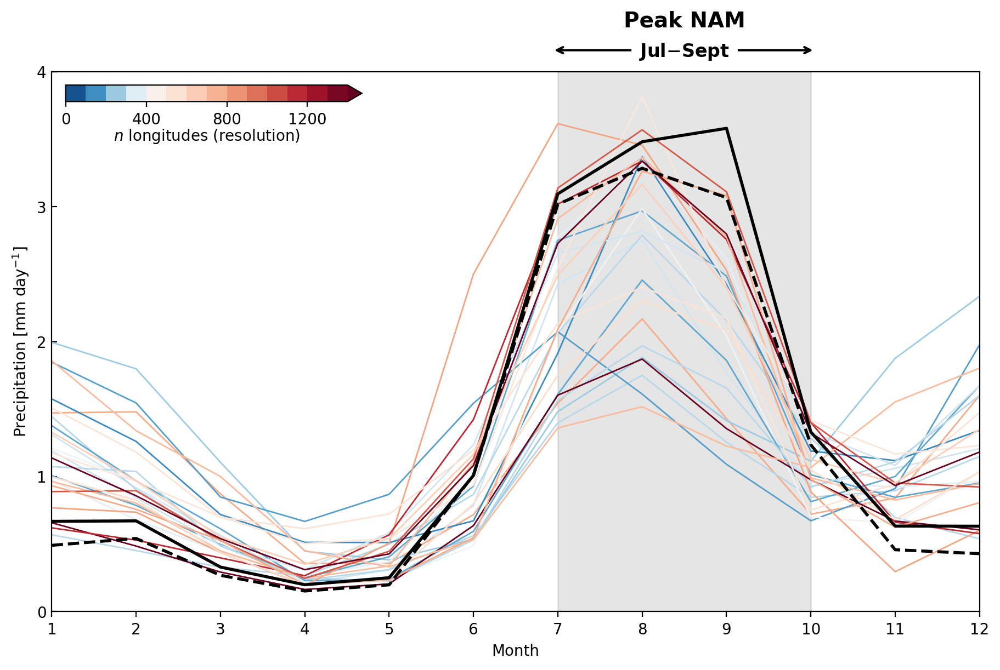

In [570]:
legend_kw = {'loc':'upper right', 'bbox_to_anchor':(2, .9), 'ncol':1,
             'fontsize':7, 'labelcolor':'linecolor', 'frameon':False, 'handlelength':1, 'handletextpad':0.5}
text_kw={'size':14, 'weight':'bold', 'color':'k', 'ha':'center', 'va':'center'}
text_kw1={'size':12, 'weight':'bold', 'color':'k', 'ha':'center', 'va':'center'}
line_kw={'ls':'-', 'lw':1}
tkw = {'axis':'y', 'direction':'in', 'labelsize':10} 
patch_kw = {'ec':'k', 'lw':1, 'ls':'-', 'fc':'k', 'alpha':0.1}
arrow_kw={'arrowstyle':'<->', 'color':'k', 'linewidth':1.5} #, 'shrinkA':0.05, 'shrinkB':0.05
# colormap
cmap = cm.RdBu_r
vmin, vmax, vcenter = 0, 1400, 400
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
levels = np.linspace(vmin, vmax, 15)  # discrete steps for cbar

# initialize figure
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9,6), layout='constrained')

for key,ds in climo_allmodels.items():
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))   # find which bin nlon belongs to
    ax.plot(
        ds.month,
        ds,
        c=color,
        label=key,
        **line_kw
    )
    
ax.plot(monthly_climo['obs']['imerg'].month, monthly_climo['obs']['imerg'],
        c='k', label='imerg', ls='-', lw=2)
ax.plot(monthly_climo['obs']['trmm'].month, monthly_climo['obs']['trmm'],
        c='k', label='trmm', ls='--', lw=2)
ax.set(xlim=[1,12], xticks=np.arange(1,13,1),
       ylim=[0,4], yticks=np.arange(0,5,1))
ax.set_xlabel('Month', color='k')
ax.set_ylabel('Precipitation [mm day$^{-1}$]', color='k')
ax.tick_params(color='k', labelcolor='k', **tkw)

# plot patch around JAS
pp=plt.Rectangle((7, 0), 3, 8, zorder=1, label='_Hidden', **patch_kw) 
ax.add_patch(pp) 
ax.text(8.5, 4.375, 'Peak NAM', **text_kw)
ax.annotate('', xy=(7/13, 1.04), xytext=(10/12.14, 1.04),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=arrow_kw, clip_on=False)
ax.text(8.5,4.15, 'Jul$-$Sept', backgroundcolor='white', **text_kw1, zorder=100)

# legend
ax.legend(**legend_kw)

# colorbar
cax=fig.add_axes([0.06, 0.855, 0.3, 0.025])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, boundaries=levels, ticks=levels[::4], extend='max', orientation='horizontal', cax=cax)
cbar.set_label("$n$ longitudes (resolution)", labelpad=0, rotation=0)
cbar.ax.xaxis.set_ticks_position('bottom') 

# save fig
plt.savefig(f'{dpath2}/figs/highresmip_pr_monthly_climo.pdf', transparent=False, bbox_inches='tight')

## Model-IMERG precip bias spatial maps

### Low Res Models

In [ ]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
#dcmap=cm.RdBu
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# topography contours
zlevels=np.linspace(1000,3000,3)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(20,15), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.025,-0.02,
         'Low/standard resolution model configurations.\n'
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(lowres.keys()):
    if 0 <= i <= 4:
        j=0
        i=i
        lons=lowres[key].lon
        lats=lowres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    elif 4 < i <= 9:
        j=1
        i=i-5
        lons=lowres[key].lon
        lats=lowres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    else:
        j=2
        i=i-10
        lons=lowres[key].lon
        lats=lowres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    
for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1.35, colors='k', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=3, linestyle='--', zorder=11) 
    # subplot labels
    ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.75)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.75)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.75)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.025, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PRECIPITATION BIAS [mm/day]', labelpad=25, rotation=270, size=18, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=18)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

plt.savefig(f'{dpath2}/figs/highresmip_jas_biases_low-res-models.png', transparent=False, bbox_inches='tight')

### High Res Models

In [ ]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# topography contours
zlevels=np.linspace(1000,3000,3)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(20,15), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.025,-0.02,
         'High resolution model configurations.\n'
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(highres.keys()):
    if 0 <= i <= 4:
        j=0
        i=i
        lons=highres[key].lon
        lats=highres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    elif 4 < i <= 9:
        j=1
        i=i-5
        lons=highres[key].lon
        lats=highres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    else:
        j=2
        i=i-10
        lons=highres[key].lon
        lats=highres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)

ax[2,4].set_visible(False)

for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1.35, colors='black', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=3, linestyle='--', zorder=11) 
    # subplot labels
    ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.75)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.75)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.75)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.025, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PRECIPITATION BIAS [mm/day]', labelpad=25, rotation=270, size=18, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=18)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_biases_high-res-models.png', transparent=False, bbox_inches='tight')

### Low vs. High Res Models

In [ ]:
del lowres['CMCC.CMCC-CM2-HR4']

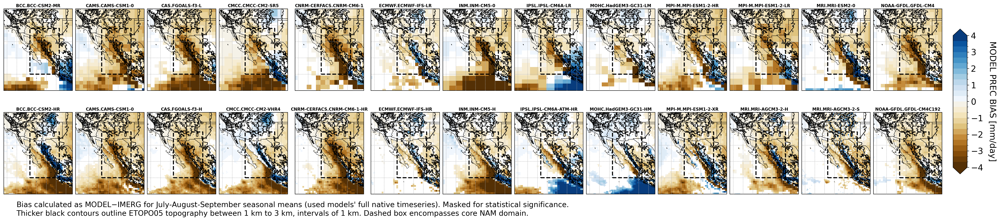

In [364]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':8, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=2, ncols=13, figsize=(25,5.5), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.015,-0.02,
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(lowres.keys()):
    lons=lowres[key].lon
    lats=lowres[key].lat
    cf=ax[0,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
    ax[0,i].text(tx, ty, key, **text_kw)

for i, key in enumerate(highres.keys()):
    lons=highres[key].lon
    lats=highres[key].lat
    cf=ax[1,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
    ax[1,i].text(tx, ty, key, **text_kw)

for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1, colors='black', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=2, linestyle='--', zorder=11) 
    # subplot labels
    #ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.5)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.5)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=False)
    gl.bottom_labels=False; gl.left_labels=False; gl.top_labels=False; gl.right_labels=False

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.015, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PREC BIAS [mm/day]', labelpad=25, rotation=270, size=16, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=16)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_biases_lr-hr-comparison.png', transparent=False, bbox_inches='tight')

In [ ]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':8, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9,9), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.015,-0.02,
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(lowres.keys()):
    lons=lowres[key].lon
    lats=lowres[key].lat
    cf=ax[0,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
    ax[0,i].text(tx, ty, key, **text_kw)

for i, key in enumerate(highres.keys()):
    lons=highres[key].lon
    lats=highres[key].lat
    cf=ax[1,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
    ax[1,i].text(tx, ty, key, **text_kw)

for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1, colors='black', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=2, linestyle='--', zorder=11) 
    # subplot labels
    #ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.5)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.5)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=False)
    gl.bottom_labels=False; gl.left_labels=False; gl.top_labels=False; gl.right_labels=False

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.015, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PREC BIAS [mm/day]', labelpad=25, rotation=270, size=16, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=16)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_biases_lr-hr-comparison.png', transparent=False, bbox_inches='tight')

In [575]:
jas_mean[key].plot()

KeyError: 'NOAA-GFDL.GFDL-CM4C192'

### Low vs. High Res Models Climo

In [ ]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':8, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# colormap
cmap,_,_,_=get_settings(field='precip', diff=False)
vmin=0
vmax=12
levels=np.linspace(vmin, vmax, 25)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=2, ncols=13, figsize=(25,5.5), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.015,-0.02,
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(lowres.keys()):
    lons=jas_mean_allmodels[key].lon
    lats=jas_mean_allmodels[key].lat
    cf=ax[0,i].pcolormesh(lons, lats, jas_mean_allmodels[key], cmap=cmap, norm=norm, transform=trans)
    ax[0,i].text(tx, ty, key, **text_kw)

for i, key in enumerate(highres.keys()):
    lons=jas_mean_allmodels[key].lon
    lats=jas_mean_allmodels[key].lat
    cf=ax[1,i].pcolormesh(lons, lats, jas_mean_allmodels[key], cmap=cmap, norm=norm, transform=trans)
    ax[1,i].text(tx, ty, key, **text_kw)

for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1, colors='black', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=2, linestyle='--', zorder=11) 
    # subplot labels
    #ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.5)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.5)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=False)
    gl.bottom_labels=False; gl.left_labels=False; gl.top_labels=False; gl.right_labels=False

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.015, 0.7])
cbar=fig.colorbar(cf, ticks=np.arange(0,13,1), orientation='vertical', extend='max', cax=cax)
cbar.set_label('MODEL PREC [mm/day]', labelpad=25, rotation=270, size=16, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=16)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_climo_lr-hr-comparison.png', transparent=False, bbox_inches='tight')

## Model-IMERG precip bias line plot

In [20]:
#=== create combined dictionary
# --> slow to run because it has to actually load the pangeo data into memory

# init dict
allmodels = {}

# set lat/lon bounds
ymin=15
ymax=45
xmin=240
xmax=270

# select nam-region data for low res models
allmodels.update({
    key: obs_diff['lr'][key].sel(lat=slice(ymin,ymax), lon=slice(xmin,xmax)).load()
    for key in lowres.keys()
})
# select nam-region data for high res models
allmodels.update({
    key: obs_diff['hr'][key].sel(lat=slice(ymin,ymax), lon=slice(xmin,xmax)).load()
    for key in highres.keys()
})
# sort models from coarsest to finest
sorted_models = dict(
    sorted(
        allmodels.items(),
        key=lambda item: len(item[1].coords["lon"])
    )
)

In [254]:

# sort models from coarsest to finest
sorted_models = dict(
    sorted(
        allmodels.items(),
        key=lambda item: len(item[1].coords["lon"]),
        reverse=False
    )
)


In [100]:
#=== Store information about model resolution

# init dict
allmodels_res = {}
# low res models
allmodels_res.update({
    key: obs_diff['lr'][key].lon
    for key in lowres.keys()
})
# high res models
allmodels_res.update({
    key: obs_diff['hr'][key].lon
    for key in highres.keys()
})

# sort models from coarsest to finest
allmodels_res = dict(
    sorted(
        allmodels_res.items(),
        key=lambda item: len(item[1].coords["lon"]),
        reverse=True
    )
)

In [330]:
#=== GET INFO ABOUT MEDIAN AND MEAN MODEL RESOLUTIONS

# Compute number of longitude points for each model
res_counts = {key: len(val.coords["lon"]) for key, val in allmodels_res.items()}

# Extract counts for each subset (keep them as dicts!)
lowres_counts = {key: len(obs_diff['lr'][key].lon) for key in lowres.keys()}
highres_counts = {key: len(obs_diff['hr'][key].lon) for key in highres.keys()}

# Compute medians
median_lowres = np.median(list(lowres_counts.values()))
median_highres = np.median(list(highres_counts.values()))

# Compute means
mean_lowres = np.mean(list(lowres_counts.values()))
mean_highres = np.mean(list(highres_counts.values()))

# Find model(s) closest to the median
median_lowres_models = [k for k, v in lowres_counts.items() if v == median_lowres]
median_highres_models = [k for k, v in highres_counts.items() if v == median_highres]

# Find model(s) closest to the mean
mean_lowres_models = min(res_counts, key=lambda k: abs(res_counts[k] - mean_lowres))
mean_highres_models = min(res_counts, key=lambda k: abs(res_counts[k] - mean_highres))

print(f"Median low-resolution grid size (lon): {median_lowres}")
print(f"Model(s) with median low resolution: {median_lowres_models}\n")
print(f"Median high-resolution grid size (lon): {median_highres}")
print(f"Model(s) with median high resolution: {median_highres_models}\n")

print(f"Mean low-resolution grid size (lon): {mean_lowres}")
print(f"Cloest model to mean low resolution: {mean_lowres_models}\n")
print(f"Mean high-resolution grid size (lon): {mean_highres}")
print(f"Cloest model to mean high resolution: {mean_highres_models}")

Median low-resolution grid size (lon): 288.0
Model(s) with median low resolution: ['CAS.FGOALS-f3-L', 'CMCC.CMCC-CM2-HR4', 'NOAA-GFDL.GFDL-CM4']

Median high-resolution grid size (lon): 768.0
Model(s) with median high resolution: ['CAMS.CAMS-CSM1-0', 'MPI-M.MPI-ESM1-2-XR']

Mean low-resolution grid size (lon): 271.6923076923077
Cloest model to mean low resolution: CNRM-CERFACS.CNRM-CM6-1

Mean high-resolution grid size (lon): 890.7692307692307
Cloest model to mean high resolution: BCC.BCC-CSM2-HR


In [22]:
#=== calculate topo profile
etopo_profile = etopoNA.sel(lat=slice(ymin, ymax),
                            lon=slice(xmin, xmax)).mean(dim="lat", skipna=True)

### Model bias averaged as distance from transect line

In [ ]:
## okay, this sort of works but need to do high and low res separately maybe with different bins?

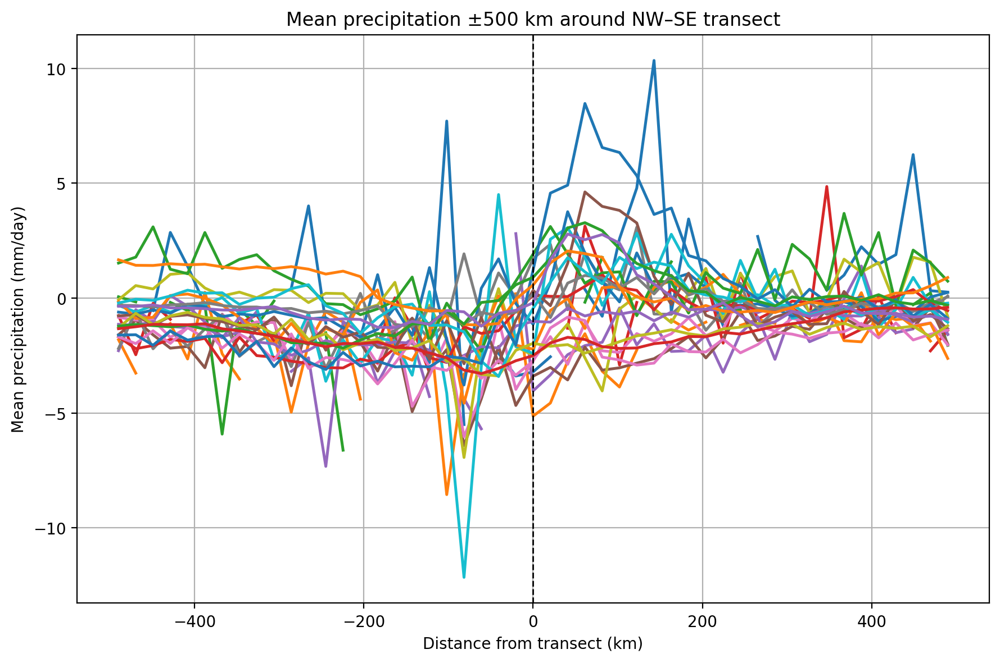

In [357]:
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic
import pyproj
from shapely.geometry import LineString, Point
import matplotlib.pyplot as plt

# ------------------------------
# 1. Define NW–SE transect
# ------------------------------
npoints = 200
transect_lat_max, transect_lat_min = 30, 20
transect_lon_max, transect_lon_min = 249, 256.5

transect_lats = np.linspace(transect_lat_max, transect_lat_min, npoints)
transect_lons = np.linspace(transect_lon_max, transect_lon_min, npoints)

# Projection centered near transect midpoint
lon0, lat0 = np.mean(transect_lons), np.mean(transect_lats)
proj = pyproj.Proj(proj="aeqd", lat_0=lat0, lon_0=lon0)

# Project transect to planar coordinates
transect_x, transect_y = proj(transect_lons, transect_lats)
transect_coords = np.column_stack((transect_x, transect_y))
transect_line = LineString(transect_coords)

# ------------------------------
# 2. Parameters
# ------------------------------
buffer_km = 400
bins = np.linspace(-buffer_km, buffer_km, 50)
bin_centers = (bins[:-1] + bins[1:]) / 2

# ------------------------------
# 3. Loop across models and save profiles
# ------------------------------
transect_profiles = {}

for name, da in sorted_models.items():

    # (Optional) time average
    if 'time' in da.dims:
        da = da.mean('time')

    # Meshgrid coordinates
    lon2d, lat2d = np.meshgrid(da.lon.values, da.lat.values)
    x2d, y2d = proj(lon2d, lat2d)

    # Compute perpendicular distance (vectorized)
    # For each grid point, create a Point and compute min distance to transect
    dist_perp_2d = np.zeros_like(x2d)
    for i in range(x2d.shape[0]):
        for j in range(x2d.shape[1]):
            point = Point(x2d[i, j], y2d[i, j])
            dist_perp_2d[i, j] = point.distance(transect_line)

    # Determine sign (which side of transect)
    # East of the transect → positive
    dx = transect_x[-1] - transect_x[0]
    dy = transect_y[-1] - transect_y[0]

    # Cross-product gives direction; flip sign so east = positive
    sign = np.sign((x2d - transect_x[0]) * dy - (y2d - transect_y[0]) * dx)
    dist_perp_2d *= -sign  # flipped so east side = positive


    # Mask within ±buffer
    mask = np.abs(dist_perp_2d) <= (buffer_km * 1000)

    # Flatten valid points
    distances = dist_perp_2d[mask] / 1000  # meters → km
    precip_vals = da.values[mask]

    # Bin-average precipitation
    if len(distances) > 0:
        profile, _, _ = binned_statistic(distances, precip_vals, statistic='mean', bins=bins)
    else:
        profile = np.full(len(bin_centers), np.nan)

    # Save to dictionary
    transect_profiles[name] = {
        "bin_centers": bin_centers,
        "profile": profile
    }

# ------------------------------
# 4. Plot all models
# ------------------------------
plt.figure(figsize=(9,6))
for name, data in transect_profiles.items():
    plt.plot(data["bin_centers"], data["profile"], lw=1.8, label=name)

plt.axvline(0, color='k', ls='--', lw=1)
plt.xlabel("Distance from transect (km)")
plt.ylabel("Mean precipitation (mm/day)")
plt.title(f"Mean precipitation ±{buffer_km} km around NW–SE transect")
#plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
plt.show()


Text(0.1, -0.025, "HighResMIP models' meridional mean precipitaiton bias 500 km west and east of transect line.\nColor of line is scaled based on model resolution, where $n$ longitudes$=$360 is approximately 1°")

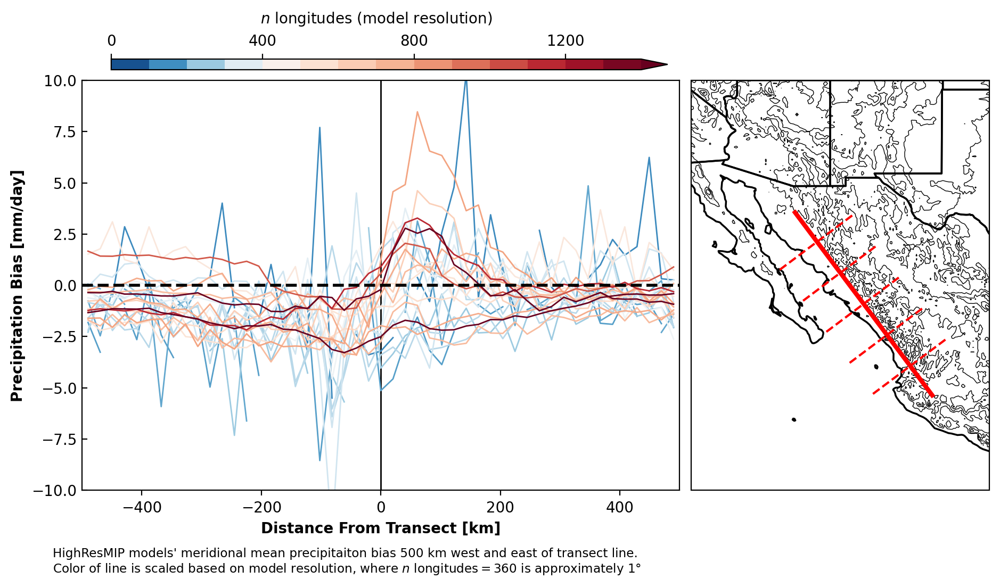

In [359]:
# settings
text_kw={'size':'medium', 'weight':'bold', 'color':'k'}
title_text_kw={'size':11, 'weight':'bold', 'color':'k', 'ha':'left', 'va':'center'}
caption_text_kw={'size':'small', 'weight':'normal', 'color':'k', 'ha':'left', 'va':'center'}
tsect_text_kw={'fontsize':10, 'fontweight':'bold', 'c':'k', 'ha':'left', 'va':'bottom'}
line_kw={'ls':'-', 'lw':1}
tkw = {'axis':'y', 'direction':'in', 'labelsize':10} 
# colormap
cmap = cm.RdBu_r
vmin, vmax, vcenter = 0, 1400, 400
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
levels = np.linspace(vmin, vmax, 15)  # discrete steps for cbar
# topography contours
zlevels=np.linspace(800,3200,5)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[243.5,259.5,15,37]

fig = plt.figure(figsize=(11,5), layout='constrained')  
gs = gridspec.GridSpec(1, 2, width_ratios=[2,1], wspace=.025)

# --- west bias line plot ---
ax1 = fig.add_subplot(gs[0, 0])
#ax1.text(-195,4.5,'MERIDIONAL MEAN BIAS',**title_text_kw)
ax1.axvline(x=0, color='k', lw=1, ls='-', label='_Hidden')
ax1.axhline(y=0, color='k', lw=2, ls='--', label='_Hidden', zorder=100)
for key, data in transect_profiles.items():
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))
    ax1.plot(data["bin_centers"], data["profile"], c=color, label=key, **line_kw)

ax1.set_xlim([-1*buffer_km, buffer_km])
ax1.set_ylim([-10,10])
ax1.set_xlabel("Distance From Transect [km]", fontweight='bold')
ax1.set_ylabel("Precipitation Bias [mm/day]", fontweight='bold')
ax1.tick_params(**tkw)


# --- topo map + transect ---
ax2 = fig.add_subplot(gs[0, 1], projection=proj)
ax2.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=0.5, colors='k', transform=trans)
# Add the transect to the map
lats = np.linspace(30, 20, npoints)
lons = np.linspace(-111, -103.5, npoints)
transect_line = LineString(zip(lons, lats))
ax2.add_geometries([transect_line],
                   crs=ccrs.PlateCarree(),
                   fc='none', ec='red',
                   lw=3, ls='-', zorder=10)
# Add perpendicular cross-lines along transect
n_perp = 5
segment_len_deg = buffer_km/100  # ~1 deg/100 km approx for midlatitudes
# sample evenly along the transect
transect_points = np.linspace(0, 1, n_perp + 2)[1:-1]  # skip endpoints
for t in transect_points:
    point = transect_line.interpolate(t, normalized=True)
    lon0, lat0 = point.x, point.y
    # compute local tangent vector using finite differences
    delta = 1e-3
    p1 = transect_line.interpolate(max(0, t - delta), normalized=True)
    p2 = transect_line.interpolate(min(1, t + delta), normalized=True)
    dx = p2.x - p1.x
    dy = p2.y - p1.y
    # perpendicular direction (−dy, dx)
    perp_dx, perp_dy = -dy, dx
    tnorm = np.sqrt(perp_dx**2 + perp_dy**2)
    perp_dx /= tnorm
    perp_dy /= tnorm
    # construct short line segment perpendicular to transect
    lon1 = lon0 - perp_dx * segment_len_deg / 2
    lat1 = lat0 - perp_dy * segment_len_deg / 2
    lon2 = lon0 + perp_dx * segment_len_deg / 2
    lat2 = lat0 + perp_dy * segment_len_deg / 2
    ax2.plot([lon1, lon2], [lat1, lat2],
             color='red', lw=1.5, ls='--',
             transform=ccrs.PlateCarree(), zorder=9)

# map properties
ax2.coastlines(color='k', linewidth=1.25)
ax2.add_feature(cfeature.STATES, edgecolor='k', linewidth=1.25)
ax2.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.25)
ax2.set_extent(map_bnds, crs=trans)



# --- Colorbar ---
cax=fig.add_axes([0.15, .9, 0.475, 0.02])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, boundaries=levels, ticks=levels[::4], spacing="proportional",
                    extend='max',orientation='horizontal', cax=cax)
cbar.set_label("$n$ longitudes (model resolution)", labelpad=-40, rotation=0)
cbar.ax.xaxis.set_ticks_position('top') 

fig.text(0.1,-0.025,
         'HighResMIP models\' meridional mean precipitaiton bias '
         f'{buffer_km} km west and east of transect line.\n'
         'Color of line is scaled based on model resolution, where $n$ longitudes$=$360 is approximately 1°',
         **caption_text_kw)

### Model bias averaged for some buffer distance east and west of transect line

In [23]:
import numpy as np
import xarray as xr
from shapely.geometry import Point
import math

# ------------------------------
# Example: define your transect
# ------------------------------
npoints = 200
transect_lats = np.linspace(33, 20, npoints)
transect_lons = np.linspace(247, 256.5, npoints)

# ------------------------------
# Buffer settings
# ------------------------------
buffer_km = 150  # distance on either side of transect (km)

# Convert buffer from km → degrees
lat_mid = np.mean(transect_lats)
deg_per_km_lon = 1 / (111 * np.cos(np.deg2rad(lat_mid)))
buffer_in_deg_lon = buffer_km * deg_per_km_lon

# ------------------------------
# Compute mean along buffered transect
# ------------------------------

mean_transect_west = {}
mean_transect_east = {}

for key, da in allmodels.items():
    west_means = []
    east_means = []

    for lon_center, lat_center in zip(transect_lons, transect_lats):
        # Select nearest latitude first
        da_lat = da.sel(lat=lat_center, method='nearest')
        
        # Slice longitudes
        subset_west = da_lat.sel(lon=slice(lon_center - buffer_in_deg_lon, lon_center))
        west_means.append(subset_west.mean().item())

        subset_east = da.sel(lon=slice(lon_center, lon_center + buffer_in_deg_lon))
        east_means.append(subset_east.mean().item())

    mean_transect_west[key] = np.array(west_means)
    mean_transect_east[key] = np.array(east_means)
    


Text(0.1, -0.025, 'Model mean precipitaiton bias 150 west and east of transect line(horizontal red dashed lines show width of region used).\nColor of line scaled based on model resolution. $n$ longitudes$=$360 is approximately 1°')

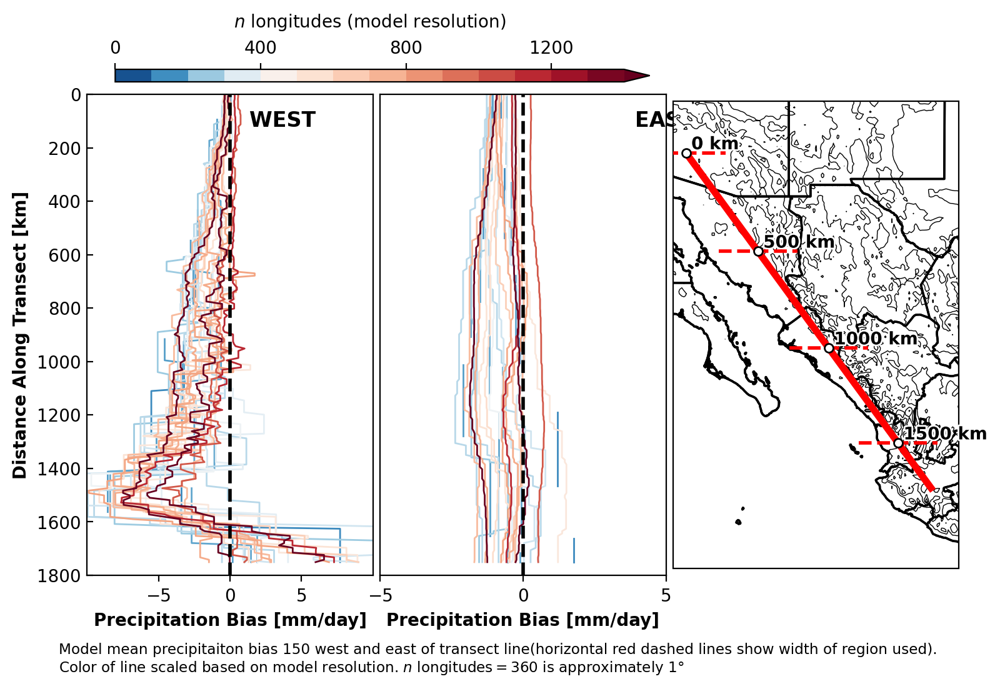

In [347]:
# settings
text_kw={'size':'medium', 'weight':'bold', 'color':'k'}
title_text_kw={'size':'large', 'weight':'bold', 'color':'k', 'ha':'right', 'va':'center'}
caption_text_kw={'size':'small', 'weight':'normal', 'color':'k', 'ha':'left', 'va':'center'}
tsect_text_kw={'fontsize':10, 'fontweight':'bold', 'c':'k', 'ha':'left', 'va':'bottom'}
line_kw={'ls':'-', 'lw':1}
tkw = {'axis':'y', 'direction':'in', 'labelsize':10} 
# colormap
cmap = cm.RdBu_r
vmin, vmax, vcenter = 0, 1400, 400
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
levels = np.linspace(vmin, vmax, 15)  # discrete steps for cbar

# topography contours
zlevels=np.linspace(800,3200,5)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[246.5,257.5,17,35]

fig = plt.figure(figsize=(9,5), layout='constrained')  
gs = gridspec.GridSpec(1, 3, width_ratios=[1,1,1], wspace=.025)

# --- west bias line plot ---
ax1 = fig.add_subplot(gs[0, 0])
ax1.text(6,100,'WEST',**title_text_kw)
ax1.axvline(x=0, color='k', lw=2, ls='--', label='_Hidden', zorder=100)

for key in sorted_models:
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))
    ax1.plot(#mean_transect_profiles[key],
             #mean_transect_east[key],
             mean_transect_west[key],
             distances, c=color, label=key, **line_kw)
ax1.set_xlim([-10, 10])
ax1.set_xticks([-5,0,5])
ax1.set_ylim([1800,0])
ax1.set_ylabel("Distance Along Transect [km]", fontweight='bold')
ax1.set_xlabel("Precipitation Bias [mm/day]", fontweight='bold')
ax1.tick_params(**tkw)

# --- east bias line plot ---
ax = fig.add_subplot(gs[0, 1])
ax.text(6,100,'EAST',**title_text_kw)
ax.axvline(x=0, color='k', lw=2, ls='--', label='_Hidden', zorder=100)

for key in sorted_models:
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))
    ax.plot(mean_transect_east[key],
             distances, c=color, label=key, **line_kw)
ax.set_xlim([-5, 5])
ax.set_xticks([-5,0,5])
ax.set_ylim([1800,0])
ax.set_yticks([])
ax.set_xlabel("Precipitation Bias [mm/day]", fontweight='bold')
ax.tick_params(**tkw)


# --- topo map + transect ---
ax2 = fig.add_subplot(gs[0, 2], projection=proj)
ax2.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=0.5, colors='k', transform=trans)
# Add the transect to the map
npoints = 200  # resolution along the transect
lats = np.linspace(33, 20, npoints)
lons = np.linspace(-113, -103.5, npoints)
transect_line = LineString(zip(lons, lats))
ax2.add_geometries(
    [transect_line],
    crs=ccrs.PlateCarree(),
    facecolor='none',
    edgecolor='red',
    linewidth=4,
    linestyle='-',
    zorder=10
)
# Add markers every 500 km along transect
step = 500  # km
ticks = np.arange(0, distances[-1], step)
for t in ticks: # Find nearest points along the transect
    idx = np.abs(distances - t).argmin()
    ax2.plot(lons[idx], lats[idx], marker='o', mec='k', mfc='w', ms=5, transform=trans, zorder=12)
    ax2.text(lons[idx]+0.2, lats[idx], f"{int(t)} km", transform=trans, **tsect_text_kw,
            path_effects=[pe.withStroke(linewidth=2, foreground="white")])
    # Show buffer width
    lon_left = lons[idx] - buffer_in_deg_lon
    lon_right = lons[idx] + buffer_in_deg_lon
    # Draw lines at top and bottom of buffer
    ax2.plot([lon_left, lon_right], [transect_lats[idx], transect_lats[idx]],
             color='r', lw=2, linestyle='--', transform=trans, zorder=11)
# map properties
ax2.coastlines(color='k', linewidth=1.25)
ax2.add_feature(cfeature.STATES, edgecolor='k', linewidth=1.25)
ax2.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.25)
ax2.set_extent(map_bnds, crs=trans)



# --- Colorbar ---
cax=fig.add_axes([0.15, .9, 0.475, 0.02])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, boundaries=levels, ticks=levels[::4], spacing="proportional",
                    extend='max',orientation='horizontal', cax=cax)
cbar.set_label("$n$ longitudes (model resolution)", labelpad=-40, rotation=0)
cbar.ax.xaxis.set_ticks_position('top') 

fig.text(0.1,-0.025,
         f'Model mean precipitaiton bias {buffer_km} west and east of transect line'
         '(horizontal red dashed lines show width of region used).\n'
         'Color of line scaled based on model resolution. $n$ longitudes$=$360 is approximately 1°',
         **caption_text_kw)

In [ ]:
"""
mean_transect_profiles = {}

for key, da in allmodels.items(): # allmodels[key] is an xarray.DataArray with dims (lat, lon)
    transect_means = []

    for lon_center, lat_center in zip(transect_lons, transect_lats):
        # Slice data within ±buffer degrees around each transect point
        subset = da.sel(
            lon=slice(lon_center - buffer_in_deg_lon, lon_center + buffer_in_deg_lon),
            lat=slice(lat_center - buffer_in_deg_lat, lat_center + buffer_in_deg_lat)
        )

        # Compute mean of all values in this “strip”
        transect_means.append(subset.mean().item())

    # Store as 1D array along transect
    mean_transect_profiles[key] = np.array(transect_means)
"""

### Model bias interpolated to transect line and plotted as distance from transect

In [228]:
from pyproj import Geod

# Define diagonal transect from NW (ymax, xmin) to SE (ymin, xmax)
npoints = 200  # resolution along the transect
lats = np.linspace(33, 20, npoints)
lons = np.linspace(247, 257, npoints)

# Compute distance along transect (in km)
geod = Geod(ellps="WGS84")
distances = [0]  # first point is 0 km
for i in range(1, len(lats)):
    _, _, d = geod.inv(lons[i-1], lats[i-1], lons[i], lats[i])  # meters
    distances.append(distances[-1] + d/1000)  # accumulate in km
distances = np.array(distances)

transect_vals = {}

for key in allmodels.keys():
    da = allmodels[key]
    
    # Create numpy arrays of dimensions and data values
    lat_vals = da['lat'].values
    lon_vals = da['lon'].values
    data_vals = da.values

    # Ensure lat is ascending for RegularGridInterpolator
    # --> climate data often has descending (i.e. N to S) lats
    if lat_vals[0] > lat_vals[-1]:
        lat_vals = lat_vals[::-1]
        data_vals = data_vals[::-1, :]
    
    # Create a bilinear interpolator over the (lat, lon) grid
    interp = RegularGridInterpolator(
        (lat_vals, lon_vals),
        data_vals,
        bounds_error=False,
        fill_value=np.nan
    )

    # Interpolate along transect
    points = np.array([lats, lons]).T
    transect_vals[key] = interp(points)


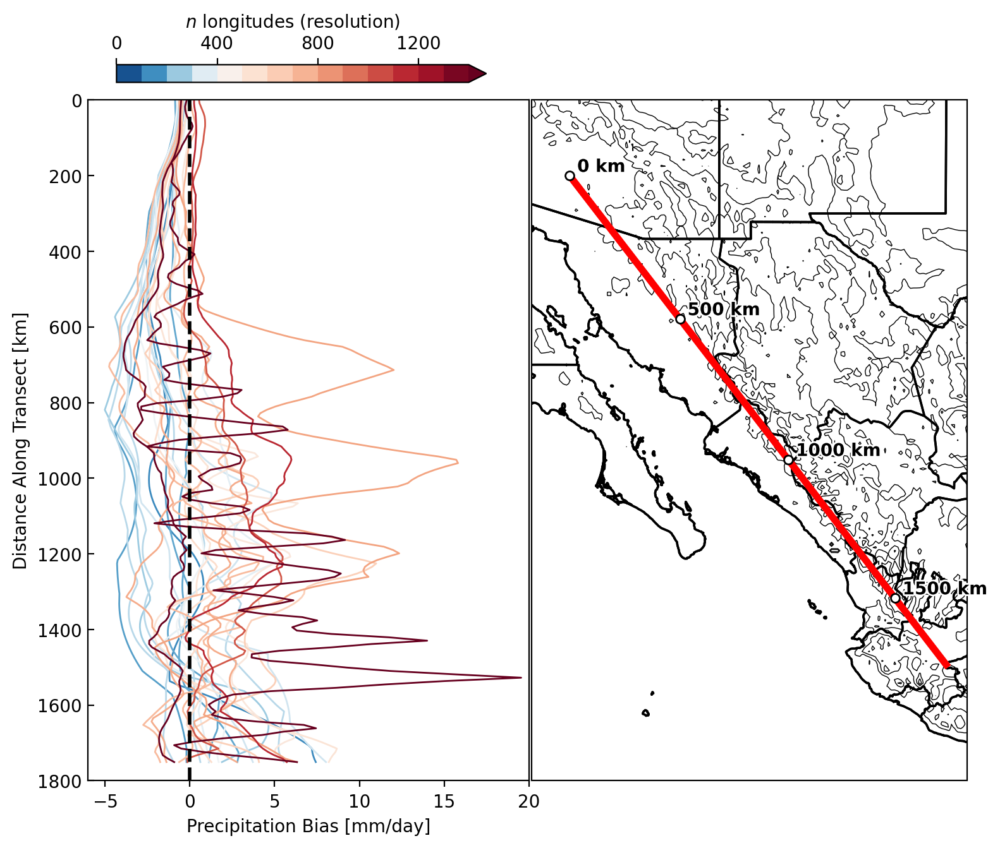

In [254]:
# settings
text_kw={'size':'medium', 'weight':'bold', 'color':'k'}
tsect_text_kw={'fontsize':10, 'fontweight':'bold', 'c':'k', 'ha':'left', 'va':'bottom'}
line_kw={'ls':'-', 'lw':1}
tkw = {'axis':'y', 'direction':'in', 'labelsize':10} 
# colormap
cmap = cm.RdBu_r
vmin, vmax, vcenter = 0, 1400, 400
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
levels = np.linspace(vmin, vmax, 15)  # discrete steps for cbar

# topography contours
zlevels=np.linspace(800,3200,5)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[246,257.5,17,35]

fig = plt.figure(figsize=(9, 7), layout='constrained')  
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1], wspace=0)

# --- Left: line plot ---
ax1 = fig.add_subplot(gs[0, 0])
ax1.axvline(x=0, color='k', lw=2, ls='--', label='_Hidden', zorder=100)

for key in sorted_models:
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))
    ax1.plot(transect_vals[key], distances, c=color, label=key, **line_kw)
ax1.set_xlim([-6, 20])
ax1.set_xticks([-5,0,5,10,15,20])
ax1.set_ylim([1800,0])
ax1.set_ylabel("Distance Along Transect [km]")
ax1.set_xlabel("Precipitation Bias [mm/day]")
ax1.tick_params(**tkw)



# --- Right: topo map ---
ax2 = fig.add_subplot(gs[0, 1], projection=proj)
ax2.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=0.5, colors='k', transform=trans)
# add box around core NAM domain
npoints = 200  # resolution along the transect
lats = np.linspace(33, 20, npoints)
lons = np.linspace(-113, -103, npoints)
transect_line = LineString(zip(lons, lats))
# Add the transect to the map
ax2.add_geometries(
    [transect_line],
    crs=ccrs.PlateCarree(),
    facecolor='none',
    edgecolor='red',
    linewidth=4,
    linestyle='-',
    zorder=10
)
# === Add markers every 500 km along transect ===
# Pick increments
step = 500  # km
ticks = np.arange(0, distances[-1], step)

# Find nearest points along the transect
for t in ticks:
    idx = np.abs(distances - t).argmin()
    ax2.plot(lons[idx], lats[idx], marker='o', mec='k', mfc='w', ms=5, transform=trans, zorder=11)
    ax2.text(lons[idx]+0.2, lats[idx], f"{int(t)} km", transform=trans, **tsect_text_kw,
            path_effects=[pe.withStroke(linewidth=2, foreground="white")])
    
# map properties
ax2.coastlines(color='k', linewidth=1.25)
ax2.add_feature(cfeature.STATES, edgecolor='k', linewidth=1.25)
ax2.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.25)
ax2.set_extent(map_bnds, crs=trans)

# --- Colorbar ---
cax=fig.add_axes([0.15, .9, 0.325, 0.02])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, boundaries=levels, ticks=levels[::4], spacing="proportional",
                    extend='max',orientation='horizontal', cax=cax)
cbar.set_label("$n$ longitudes (resolution)", labelpad=-40, rotation=0)
cbar.ax.xaxis.set_ticks_position('top') 

### Low vs. High MME Mean Bias Maps and Line Plot

In [440]:
# determine what the lowest resolution model of each set is based on length of lon dimension
lr_sorted = dict(sorted(lowres.items(), key=lambda item: len(item[1].coords["lon"])))
hr_sorted = dict(sorted(highres.items(), key=lambda item: len(item[1].coords["lon"])))

In [395]:
#=== Calculate MME means ===#

# init dict
mme = { 'lr':{}, 'hr':{} }

# Define target coordinates based on lowest resolution model for LR and HR configs
# IPSL models are lowest resolution for each set
# --> 'IPSL.IPSL-CM6A-LR'
# --> 'IPSL.IPSL-CM6A-ATM-HR'
res_key = { 'lr':'IPSL.IPSL-CM6A-LR', 'hr':'IPSL.IPSL-CM6A-ATM-HR'}


#=== LOW RES MODELS
config='lr'
target_name = res_key[config]
target_lats = allmodels[target_name].lat.values
target_lons = allmodels[target_name].lon.values

# re-grid data
regridded_data=[] # Create a new xarray dataset for storing regridded data
for index,key in enumerate(lowres.keys()):
    ds = allmodels[key]
    # add new coordinate to concatenate along
    ds = ds.assign_coords(source_id=key)
    # interp to standard grid
    ds_lr=ds.interp(lat=target_lats, lon=target_lons)
    # concatenate
    if index==0:
        regridded_data=ds_lr
    else:
        regridded_data=xr.concat([regridded_data,ds_lr], dim='source_id', coords='minimal')
        
# calculate mme mean
mme[config] = regridded_data.mean(dim='source_id')


#=== HIGH RES MODELS
config='hr'
target_name = res_key[config]
target_lats = allmodels[target_name].lat.values
target_lons = allmodels[target_name].lon.values

# re-grid data
regridded_data=[] # Create a new xarray dataset for storing regridded data
for index,key in enumerate(highres.keys()):
    ds = allmodels[key]
    # add new coordinate to concatenate along
    ds = ds.assign_coords(source_id=key)
    # interp to standard grid
    ds_lr=ds.interp(lat=target_lats, lon=target_lons)
    # concatenate
    if index==0:
        regridded_data=ds_lr
    else:
        regridded_data=xr.concat([regridded_data,ds_lr], dim='source_id', coords='minimal')
        
# calculate mme mean
mme[config] = regridded_data.mean(dim='source_id')


In [390]:
from pyproj import Geod

# Define diagonal transect from NW (ymax, xmin) to SE (ymin, xmax)
npoints = 200  # resolution along the transect
lats = np.linspace(33, 20, npoints)
lons = np.linspace(247, 257, npoints)

# Compute distance along transect (in km)
geod = Geod(ellps="WGS84")
distances = [0]  # first point is 0 km
for i in range(1, len(lats)):
    _, _, d = geod.inv(lons[i-1], lats[i-1], lons[i], lats[i])  # meters
    distances.append(distances[-1] + d/1000)  # accumulate in km
distances = np.array(distances)

transect_vals = {}

for key in allmodels.keys():
    da = allmodels[key]
    
    # Create numpy arrays of dimensions and data values
    lat_vals = da['lat'].values
    lon_vals = da['lon'].values
    data_vals = da.values

    # Ensure lat is ascending for RegularGridInterpolator
    # --> climate data often has descending (i.e. N to S) lats
    if lat_vals[0] > lat_vals[-1]:
        lat_vals = lat_vals[::-1]
        data_vals = data_vals[::-1, :]
    
    # Create a bilinear interpolator over the (lat, lon) grid
    interp = RegularGridInterpolator(
        (lat_vals, lon_vals),
        data_vals,
        bounds_error=False,
        fill_value=np.nan
    )

    # Interpolate along transect
    points = np.array([lats, lons]).T
    transect_vals[key] = interp(points)


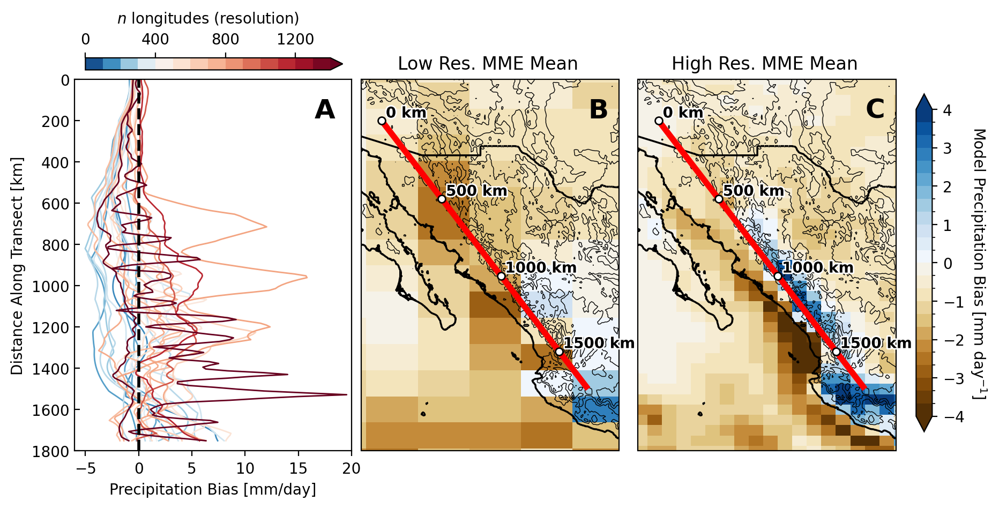

In [455]:
# settings
text_kw={'size':18, 'weight':'bold', 'color':'k', 'ha':'center', 'va':'center'}
text_kw1={'size':12, 'weight':'normal', 'color':'k', 'ha':'center', 'va':'center'}
tsect_text_kw={'fontsize':10, 'fontweight':'bold', 'c':'k', 'ha':'left', 'va':'bottom'}
line_kw={'ls':'-', 'lw':1}
tkw = {'axis':'y', 'direction':'in', 'labelsize':10} 
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# resolution colormap
cmap = cm.RdBu_r
vmin, vmax, vcenter = 0, 1400, 400
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
levels = np.linspace(vmin, vmax, 15)  # discrete steps for cbar
# topography contours
zlevels=np.linspace(800,3200,5)
# transect line
npoints = 200  # resolution along the transect
lats = np.linspace(33, 20, npoints)
lons = np.linspace(-113, -103, npoints)
transect_line = LineString(zip(lons, lats))
# transect line increments
step = 500  # km
ticks = np.arange(0, distances[-1], step)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[246,258.5,17,35]

fig = plt.figure(figsize=(10, 4.5), layout='constrained')  
gs = gridspec.GridSpec(1, 3, width_ratios=[1,1,1], wspace=0)


# --- bias line plot ---
ax1 = fig.add_subplot(gs[0, 0])
ax1.text(17.5,150,'A',**text_kw)
ax1.axvline(x=0, color='k', lw=2, ls='--', label='_Hidden', zorder=100)
for key in sorted_models:
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))
    ax1.plot(transect_vals[key], distances, c=color, label=key, **line_kw)
ax1.set_xlim([-6, 20])
ax1.set_xticks([-5,0,5,10,15,20])
ax1.set_ylim([1800,0])
ax1.set_ylabel("Distance Along Transect [km]")
ax1.set_xlabel("Precipitation Bias [mm/day]")
ax1.tick_params(**tkw)

# --- lr mme mean map ---
ax2 = fig.add_subplot(gs[0, 1], projection=proj)
ax2.text(-102.5,33.5,'B',**text_kw)
ax2.text(-107.85,35.75,'Low Res. MME Mean',**text_kw1)
ax2.pcolormesh(mme['lr'].lon, mme['lr'].lat, mme['lr'], cmap=dcmap, norm=dnorm, transform=trans)
ax2.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=0.5, colors='k', transform=trans)
# add transect line to the map
ax2.add_geometries(
    [transect_line],
    crs=ccrs.PlateCarree(),
    facecolor='none',
    edgecolor='red',
    linewidth=4,
    linestyle='-',
    zorder=10)
# add markers every 500 km along transect
for t in ticks:
    idx = np.abs(distances - t).argmin()
    ax2.plot(lons[idx], lats[idx], marker='o', mec='k', mfc='w', ms=5, transform=trans, zorder=11)
    ax2.text(lons[idx]+0.2, lats[idx], f"{int(t)} km", transform=trans, **tsect_text_kw,
            path_effects=[pe.withStroke(linewidth=2, foreground="white")])
# map properties
ax2.coastlines(color='k', linewidth=1.25)
#ax2.add_feature(cfeature.STATES, edgecolor='k', linewidth=1.25)
ax2.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.25)
ax2.set_extent(map_bnds, crs=trans)


# --- hr mme mean map ---
ax3 = fig.add_subplot(gs[0, 2], projection=proj)
ax3.text(-102.5,33.5,'C',**text_kw)
ax3.text(-107.85,35.75,'High Res. MME Mean',**text_kw1)
cf=ax3.pcolormesh(mme['hr'].lon, mme['hr'].lat, mme['hr'], cmap=dcmap, norm=dnorm, transform=trans)
ax3.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=0.5, colors='k', transform=trans)
# add transect line to the map
ax3.add_geometries(
    [transect_line],
    crs=ccrs.PlateCarree(),
    facecolor='none',
    edgecolor='red',
    linewidth=4,
    linestyle='-',
    zorder=10)
# add markers every 500 km along transect
for t in ticks:
    idx = np.abs(distances - t).argmin()
    ax3.plot(lons[idx], lats[idx], marker='o', mec='k', mfc='w', ms=5, transform=trans, zorder=11)
    ax3.text(lons[idx]+0.2, lats[idx], f"{int(t)} km", transform=trans, **tsect_text_kw,
            path_effects=[pe.withStroke(linewidth=2, foreground="white")])
# map properties
ax3.coastlines(color='k', linewidth=1.25)
#ax3.add_feature(cfeature.STATES, edgecolor='k', linewidth=1.25)
ax3.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.25)
ax3.set_extent(map_bnds, crs=trans)


# --- Colorbar ---
cax=fig.add_axes([0.135, .9, 0.24, 0.025])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, boundaries=levels, ticks=levels[::4], spacing="proportional",
                    extend='max',orientation='horizontal', cax=cax)
cbar.set_label("$n$ longitudes (resolution)", labelpad=-40, rotation=0)
cbar.ax.xaxis.set_ticks_position('top') 

cax=fig.add_axes([.91, 0.15, 0.015, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('Model Precipitation Bias [mm day$^{-1}$]', labelpad=16, rotation=270, size=10, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=10)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')
    
plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_biases_map_transect.pdf', transparent=False, bbox_inches='tight')

### Simple meridional mean bias for rectangular area

In [ ]:
"""
# calculate mean meridional bias between 25°N to 30°N
# set lat/lon bounds
ymin=26.5
ymax=27.5
xmin=249.5
xmax=255

lr_bias_profile = collections.defaultdict(dict) # initialize dict

lr_bias_profile = {
    key: obs_diff['lr'][key]
        .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
        .mean(dim="lat", skipna=True)
        .load()
    for key in lowres.keys()
}

hr_bias_profile = collections.defaultdict(dict) # initialize dict

hr_bias_profile = {
    key: obs_diff['hr'][key]
        .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
        .mean(dim="lat", skipna=True)
        .load()
    for key in highres.keys()
}

"\ncbar.ax.tick_params(labelsize='x-large')\nfor tick in cbar.ax.yaxis.get_major_ticks():\n    tick.label1.set_fontweight('bold')\n\n"

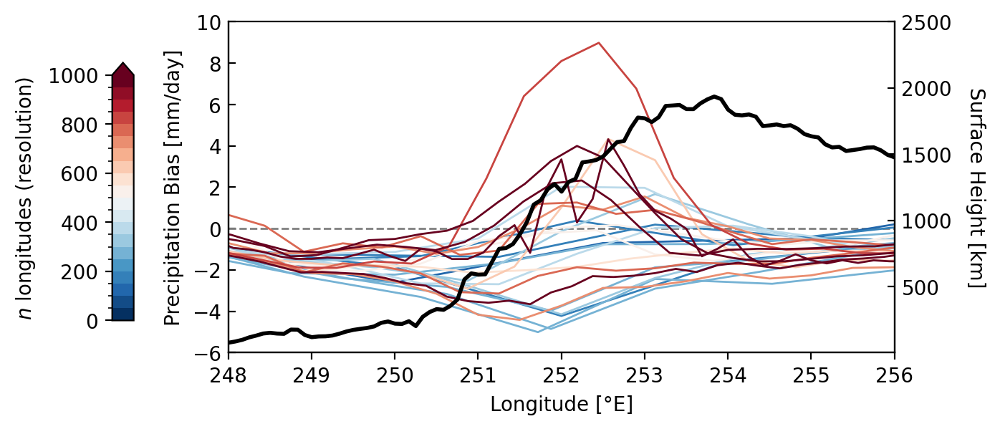

In [87]:
legend_kw = {'loc':'upper right', 'bbox_to_anchor':(2, .9), 'ncol':2,
             'fontsize':7, 'labelcolor':'linecolor', 'frameon':True, 'handlelength':1, 'handletextpad':0.5}
text_kw={'size':'medium', 'weight':'bold', 'color':'k'}
line_kw={'ls':'-', 'lw':1}
eline_kw={'ls':'-', 'lw':2}
tkw = {'axis':'y', 'direction':'in', 'labelsize':10} 
# var specs
prof_min=26 # min lat for profile
prof_max=28 # max lat for profile
lons = etopo_profile.lon
# Normalize colors by resolution
#min_lon = min(len(ds.lon) for ds in jas_mean['lr'].values())
#max_lon = max(len(ds.lon) for ds in jas_mean['hr'].values())
#vmin, vmax = min_lon, max_lon
cmap = cm.RdBu_r
levels = np.linspace(0,1000,21)
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)

# initialize figure
fig = plt.figure(figsize=(6, 3))

# plot model-obs biases
ax1 = plt.subplot(111)
ax1.axhline(y=0, color='gray', linewidth=1, linestyle='--', label='_Hidden') # plot 0 line
for key in sorted_models:
    nlon = len(allmodels_res[key].lon)
    color = cmap(norm(nlon))   # find which bin nlon belongs to
    ax1.plot(
        sorted_models[key].lon,
        sorted_models[key].sel(lat=slice(prof_min, prof_max)).mean(dim='lat'),
        c=color,
        label=key,
        **line_kw
    )
ax1.set(xlim=[248,256],
        ylim=[-6,10], yticks=[-6,-4,-2,0,2,4,6,8,10])
ax1.set_ylabel('Precipitation Bias [mm/day]', color='k')
ax1.tick_params(color='k', labelcolor='k', **tkw)
ax1.set_xlabel('Longitude [°E]', color='k')
#plt.xlim([248,256])

# instantiate a second axes that shares the same x-axis
ax2 = ax1.twinx() 
# plot etopo surface height data
ax2.plot(lons, etopo_profile, c='k', label='ETOPO05', **eline_kw) 
ax2.set(ylim=[0, 2500],
        yticks=[500,1000,1500,2000,2500])
ax2.set_ylabel('Surface Height [km]', color='k', rotation=270, labelpad=17)
ax2.tick_params(color='k', labelcolor='k', **tkw)

# plot formatting
ax1.spines['left'].set_color('black')
ax1.spines['top'].set_color('black')
ax2.spines['top'].set_color('none')
ax2.spines['left'].set_color('black')
ax2.spines['right'].set_color('black')

#lines1, labels1 = ax1.get_legend_handles_labels()
#lines2, labels2 = ax2.get_legend_handles_labels()
#ax1.legend(lines1 + lines2, labels1 + labels2, **legend_kw)

# colorbar
cax=fig.add_axes([-0.01, 0.185, 0.025, 0.6])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, boundaries=levels, ticks=levels[::4], extend='max', orientation='vertical', cax=cax)
cbar.set_label("$n$ longitudes (resolution)", labelpad=-60, rotation=90) #, size='x-large', fontweight='bold', ha='center')
cbar.ax.yaxis.set_ticks_position('left') 
"""
cbar.ax.tick_params(labelsize='x-large')
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label1.set_fontweight('bold')

"""

## 2050-present change in precip

In [357]:
#=== CALCULATE STATISTICAL SIGNIFICANCE VS OBS

# initialize dictionaries
hr_diff      = { }
hr_diff_mask = { }
hr_ptvals    = { }

# identify models that have future and present simulations
common_keys = highres.keys() & highres_future.keys()

# Loop and perform operation
for key in common_keys:
    print(key)
    hr_diff[key] = jas_mean['hr_future'][key] - jas_mean['hr'][key]
    """
    diff_, diff_mask_, ptvals_ = sigtest2n(ann_jas_mean['hr_future'][key], ann_jas_mean['hr'][key],
                                           jas_mean['hr_future'][key], jas_mean['hr'][key])
    hr_diff[key] = diff_
    hr_diff_mask[key] = diff_mask_
    hr_ptvals[key] = ptvals_
    """    
print('Done.')

MOHC.HadGEM3-GC31-HM
MRI.MRI-AGCM3-2-H
MRI.MRI-AGCM3-2-S
CMCC.CMCC-CM2-VHR4
NOAA-GFDL.GFDL-CM4C192
Done.


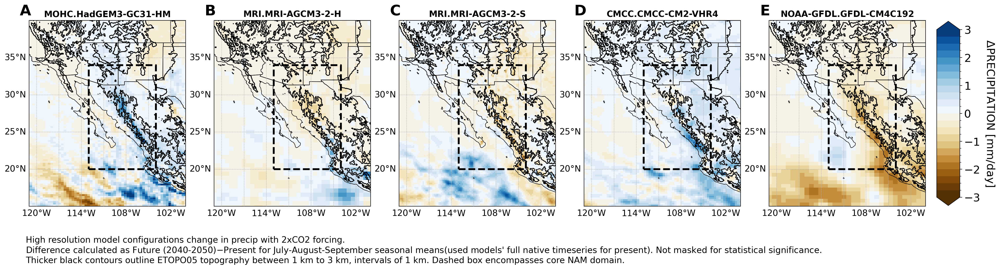

In [360]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
#dcmap=cm.RdBu
dvmin=-3
dvmax=3
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# topography contours
zlevels=np.linspace(1000,3000,3)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(21,6), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.025,-0.02,
         'High resolution model configurations change in precip with 2xCO2 forcing.\n'
         'Difference calculated as Future (2040-2050)$-$Present for July-August-September seasonal means'
         '(used models\' full native timeseries for present). '
         'Not masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(hr_diff.keys()):
    lons=hr_diff[key].lon
    lats=hr_diff[key].lat
    cf=ax[i].pcolormesh(lons, lats, hr_diff[key], cmap=dcmap, norm=dnorm, transform=trans)
    ax[i].text(tx, ty, key, **text_kw)
    
for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1.35, colors='k', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=3, linestyle='--', zorder=11) 
    # subplot labels
    ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.75)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.75)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.75)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.025, 0.7])
cbar=fig.colorbar(cf, ticks=[-3,-2,-1,0,1,2,3], orientation='vertical', extend='both', cax=cax)
cbar.set_label('$\Delta$PRECIPITATION [mm/day]', labelpad=25, rotation=270, size=18, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=18)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{dpath2}/figs/highresmip_jas_biases_low-res-models.png', transparent=False, bbox_inches='tight')

## Export info about mean NAM bias and model resolution

In [ ]:
#=== low res

# define lat/lon bounds of NAM region
lat_min = 20
lat_max = 34
lon_min = 247
lon_max = 256

#=== Get info about low res models

# initialize arrays
instIDs  = []
modelIDs = []
nam_bias = []
xres     = []
yres     = []

for key in lowres.keys():
    
    # divide the model keys to create lists for the first two columns of data.
    instID, modelID, = key.split(sep='.')
    instIDs.append(instID)
    modelIDs.append(modelID)

    # calculate mean jas precip bias within nam region
    bias = obs_diff['lr'][key].sel(lon=slice(lon_min,lon_max), lat=slice(lat_min,lat_max)).values
    nam_bias.append(np.mean(bias))

    # get info about model resolution
    xlen = lowres[key].lon.shape[0]
    ylen = lowres[key].lat.shape[0]
    xres.append(xlen)
    yres.append(ylen)
                    
# store all info into an array
lowres_biases = np.array([instIDs, modelIDs, xres, yres, nam_bias])

                    
                    
#=== Repeat for high res models
                    
# initialize arrays
instIDs  = []
modelIDs = []
nam_bias = []
xres     = []
yres     = []

for key in highres.keys():
    
    # divide the model keys to create lists for the first two columns of data.
    instID, modelID, = key.split(sep='.')
    instIDs.append(instID)
    modelIDs.append(modelID)

    # calculate mean jas precip bias within nam region
    bias = obs_diff['hr'][key].sel(lon=slice(lon_min,lon_max), lat=slice(lat_min,lat_max)).values
    nam_bias.append(np.mean(bias))

    # get info about model resolution
    xlen = highres[key].lon.shape[0]
    ylen = highres[key].lat.shape[0]
    xres.append(xlen)
    yres.append(ylen)
                    
# store all info into an array
highres_biases = np.array([instIDs, modelIDs, xres, yres, nam_bias])


In [ ]:
# export to csv
np.savetxt(fname='hrmip.nam.bias.lr.csv', delimiter=',',X=lowres_biases, fmt='%s')
np.savetxt(fname='hrmip.nam.bias.hr.csv', delimiter=',',X=highres_biases, fmt='%s')